## Registration after using HD-BET for Skull Stripping
By registering the 1.5T images to the 3T images, we ensure that any comparison between the two sets of images is accurate and that anatomical structures are aligned. This allows for meaningful comparison of imaging biomarkers, assessment of image quality differences, and evaluation of clinical findings across the different imaging systems.

In [1]:
!pip install SimpleITK

In [13]:
import os
import glob
import SimpleITK as sitk
import matplotlib.pyplot as plt
from tqdm import tqdm
import numpy as np
import shutil

In [14]:
def load_image(file_path):
    return sitk.ReadImage(file_path, sitk.sitkFloat32)

In [15]:
# Optimizer settings Number 1
learning_rate = 0.01
min_step = 1e-7
number_of_iterations = 7500  
gradient_magnitude_tolerance = 1e-9

In [16]:
# Optimizer settings Number 2
learning_rate = 0.01
min_step = 1e-7
number_of_iterations = 8000  
gradient_magnitude_tolerance = 1e-9

In [17]:
def perform_registration(fixed_image, moving_image):
    initial_transform = sitk.CenteredTransformInitializer(fixed_image,
                                                          moving_image,
                                                          sitk.Euler3DTransform(),
                                                          sitk.CenteredTransformInitializerFilter.GEOMETRY)

    registration_method = sitk.ImageRegistrationMethod()
    registration_method.SetMetricAsMeanSquares()
    registration_method.SetInterpolator(sitk.sitkLinear)

    registration_method.SetOptimizerAsRegularStepGradientDescent(learningRate=learning_rate,
                                                                 minStep=min_step,
                                                                 numberOfIterations=number_of_iterations,
                                                                 gradientMagnitudeTolerance=gradient_magnitude_tolerance)

    registration_method.SetInitialTransform(initial_transform, inPlace=False)

    registration_method.SetShrinkFactorsPerLevel(shrinkFactors=[4, 2, 1])
    registration_method.SetSmoothingSigmasPerLevel(smoothingSigmas=[2, 1, 0])
    registration_method.SmoothingSigmasAreSpecifiedInPhysicalUnitsOn()

    final_transform = registration_method.Execute(fixed_image, moving_image)
    return final_transform

In [18]:
def resample_image(moving_image, transform, reference_image):
    resampler = sitk.ResampleImageFilter()
    resampler.SetReferenceImage(reference_image)
    resampler.SetInterpolator(sitk.sitkLinear)
    resampler.SetDefaultPixelValue(0)
    resampler.SetTransform(transform)

    resampler.SetSize(reference_image.GetSize())
    resampler.SetOutputSpacing(reference_image.GetSpacing())
    resampler.SetOutputOrigin(reference_image.GetOrigin())
    resampler.SetOutputDirection(reference_image.GetDirection())

    return resampler.Execute(moving_image)


In [19]:
def process_images(dataset_path, output_dir):
    nii_files = glob.glob(os.path.join(dataset_path, '*.nii.gz'))

    patient_dict = {}

    for nii_file in nii_files:
        patient_id = os.path.basename(nii_file)[:4]
        if patient_id not in patient_dict:
            patient_dict[patient_id] = {'1_5T': None, '3_0T': None}

        if '3_0T' in nii_file:
            patient_dict[patient_id]['3.0T'] = nii_file
        elif '1_5T' in nii_file:
            patient_dict[patient_id]['1.5T'] = nii_file

    for patient_id, images in tqdm(patient_dict.items(), desc="Processing images"):
        image_3T_file = images['3.0T']
        image_1_5T_file = images['1.5T']

        if image_3T_file and image_1_5T_file:
            fixed_image = sitk.ReadImage(image_3T_file, sitk.sitkFloat32)
            moving_image = sitk.ReadImage(image_1_5T_file, sitk.sitkFloat32)

            transform = perform_registration(fixed_image, moving_image)
            registered_image = resample_image(moving_image, transform, fixed_image)

            patient_output_dir = os.path.join(output_dir, patient_id)
            os.makedirs(patient_output_dir, exist_ok=True)

            registered_image_file = os.path.join(patient_output_dir, os.path.basename(image_1_5T_file).replace('1_5T', '1_5T_registered'))
            sitk.WriteImage(registered_image, registered_image_file)

            shutil.copy(image_3T_file, os.path.join(patient_output_dir, os.path.basename(image_3T_file)))


In [12]:
def main(dataset_path, output_dir):
    os.makedirs(output_dir, exist_ok=True)
    process_images(dataset_path, output_dir)

In [24]:
dataset_path = '/scratch/Costanza/ADNI_F_SkullStripping'
output_dir = '/scratch/Costanza/Registration/ADNI_F_SK_Registered'
main(dataset_path, output_dir)

Processing images:   0%|          | 0/44 [00:00<?, ?it/s]

Processing images: 100%|██████████| 44/44 [14:15:31<00:00, 1166.62s/it]  


In [20]:
dataset_path = '/scratch/Costanza/ADNI_F_SkullStripping'
output_dir = '/scratch/Costanza/Registration/ADNI_F_SK_Registered_2'
main(dataset_path, output_dir)

Processing images: 100%|██████████| 44/44 [14:52:40<00:00, 1217.28s/it]  


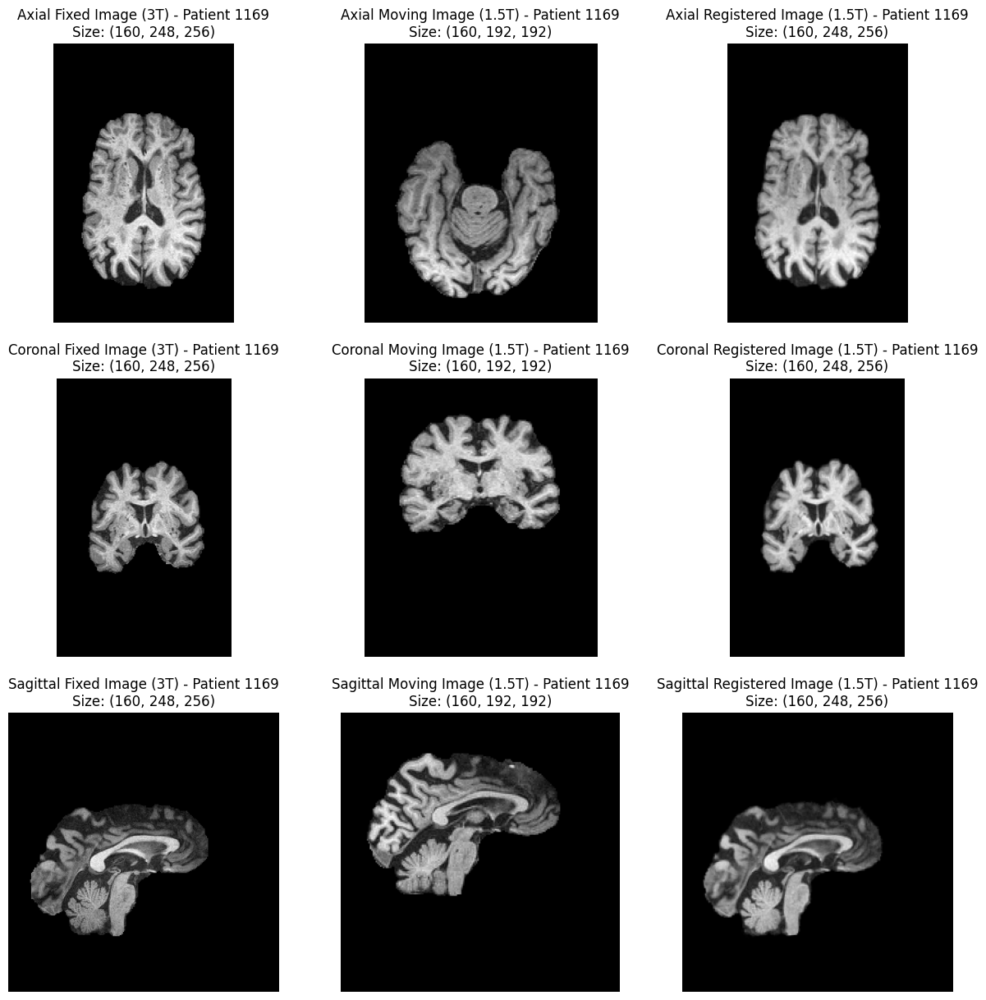

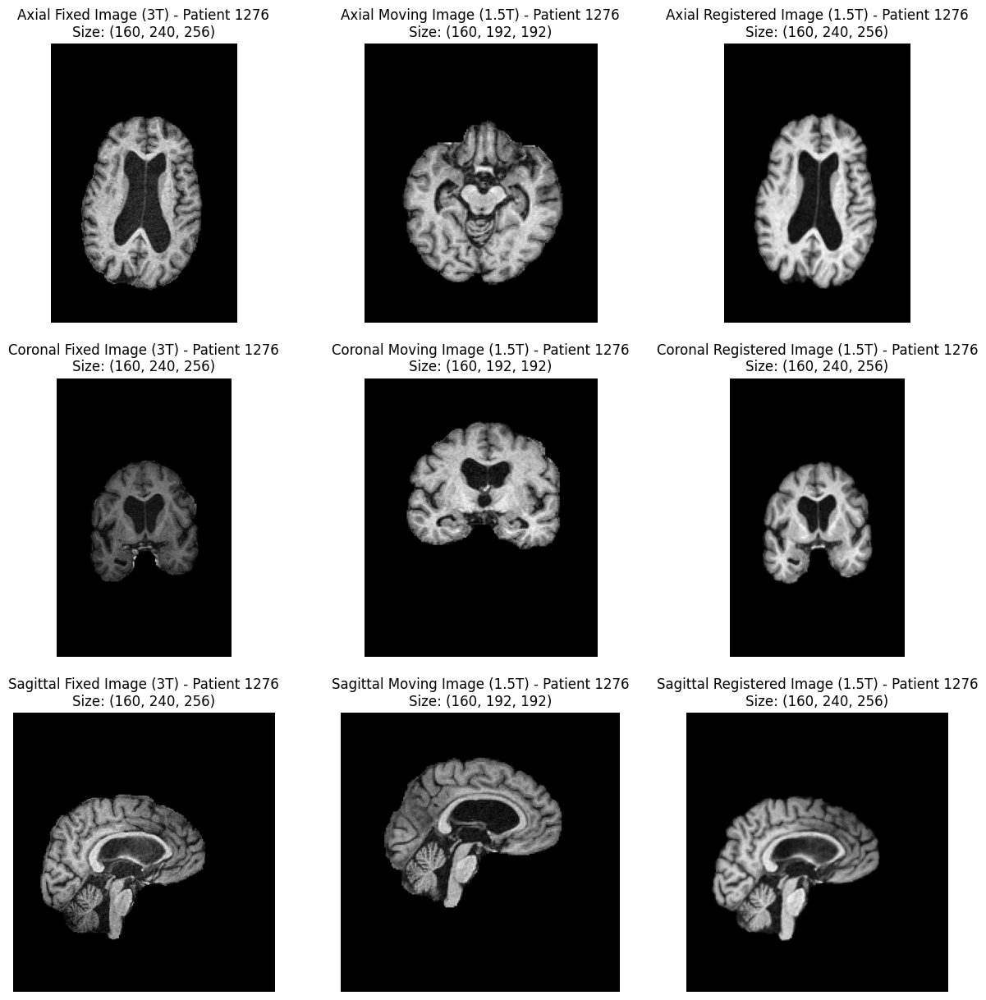

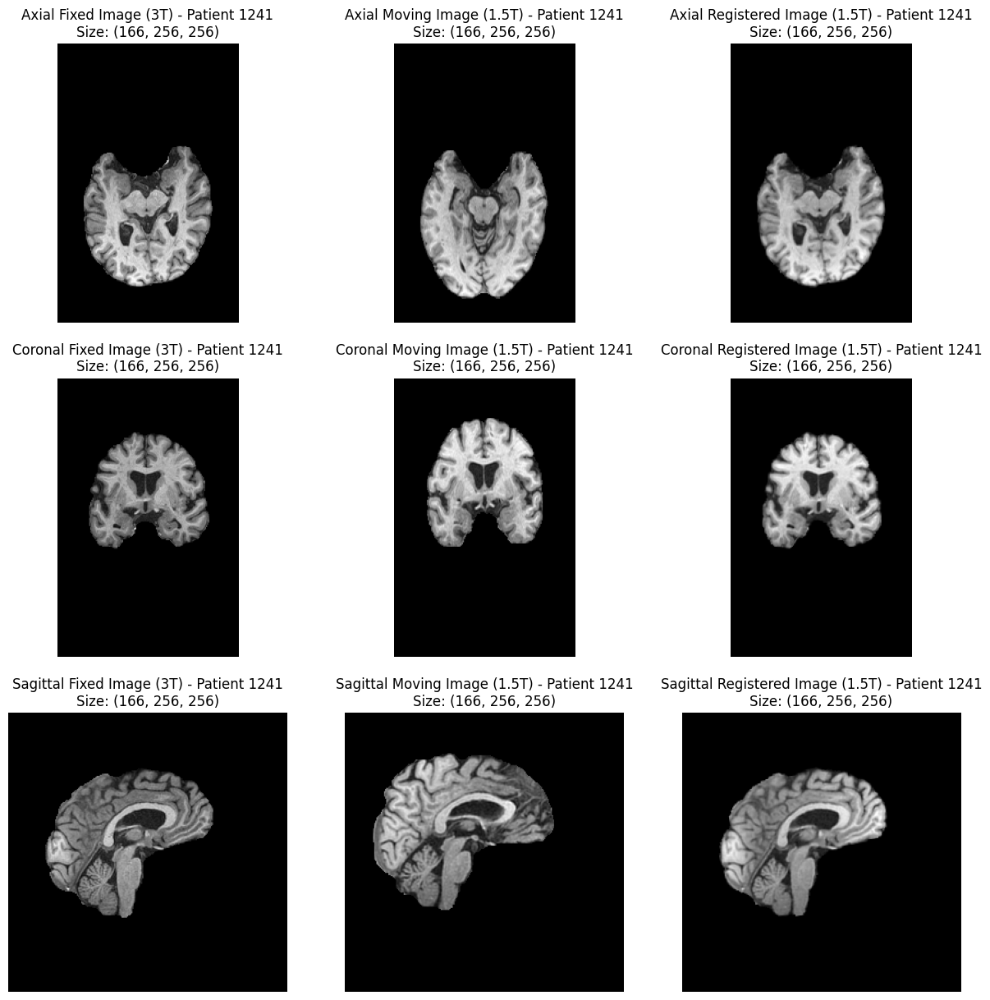

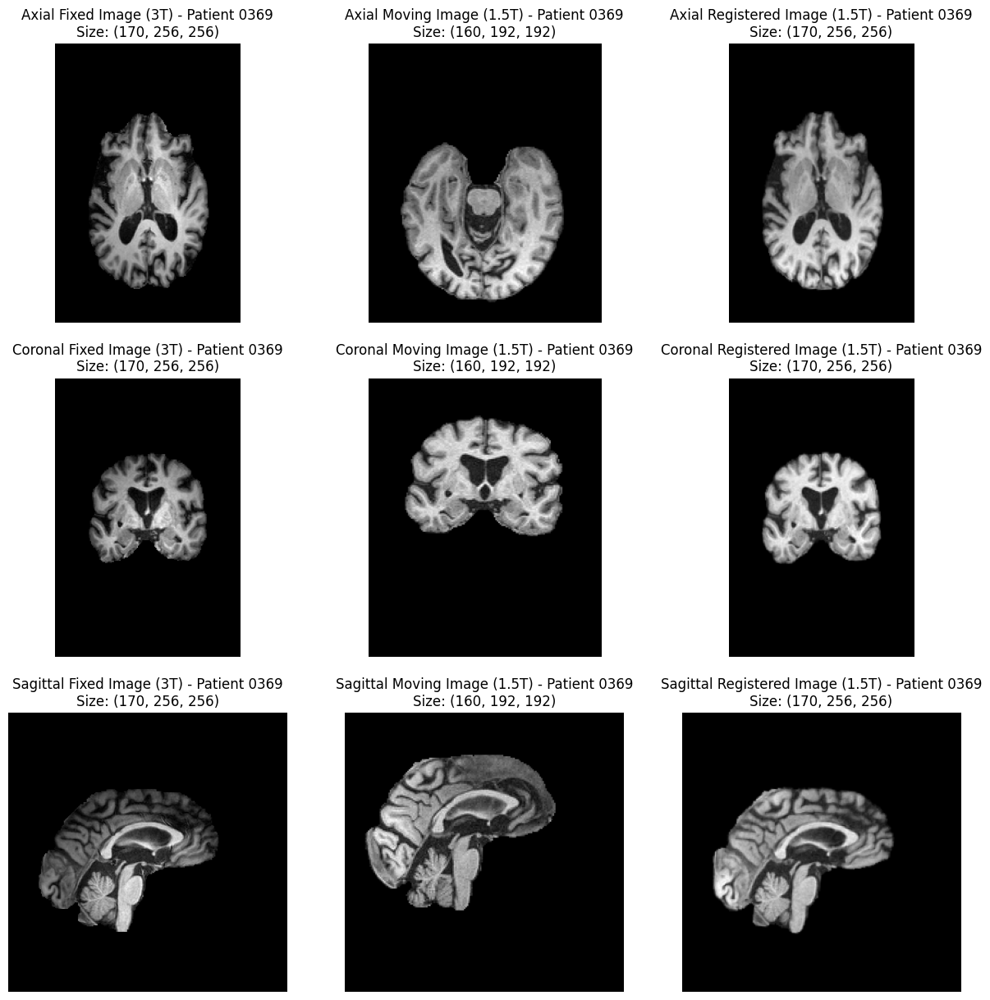

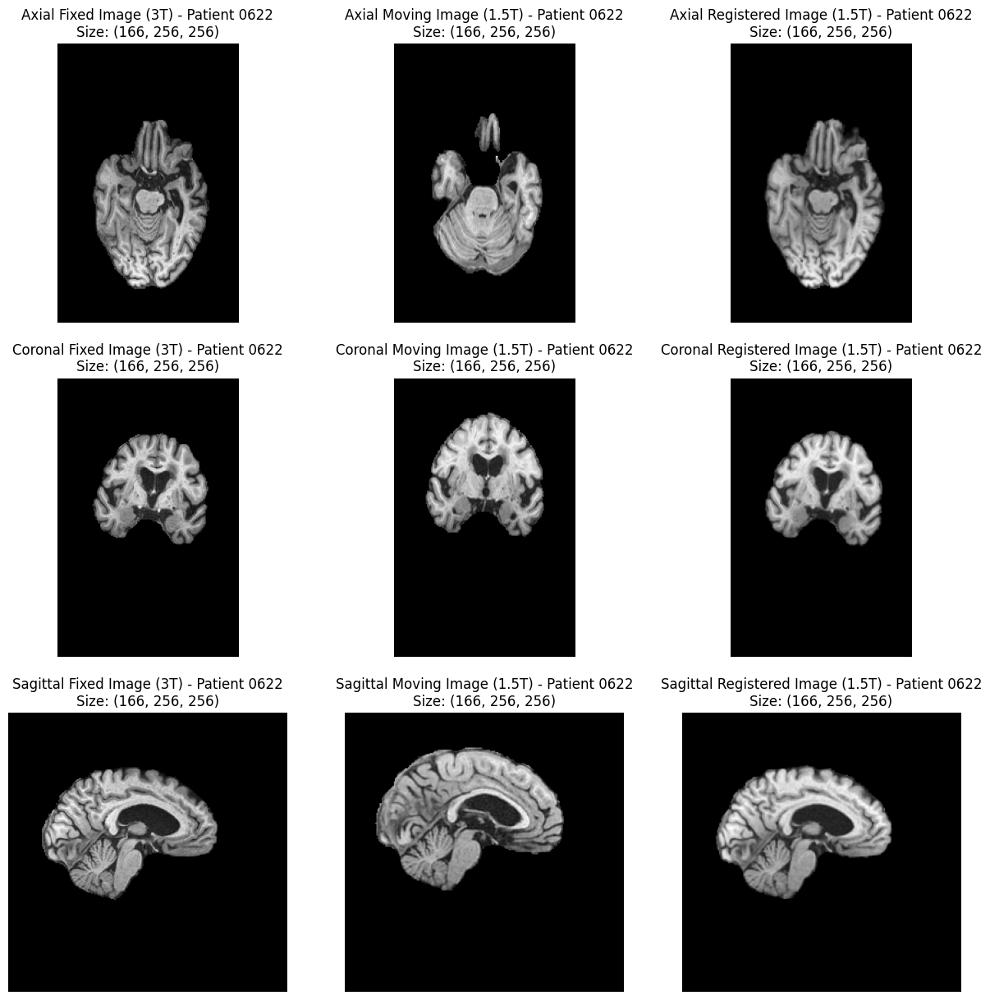

...

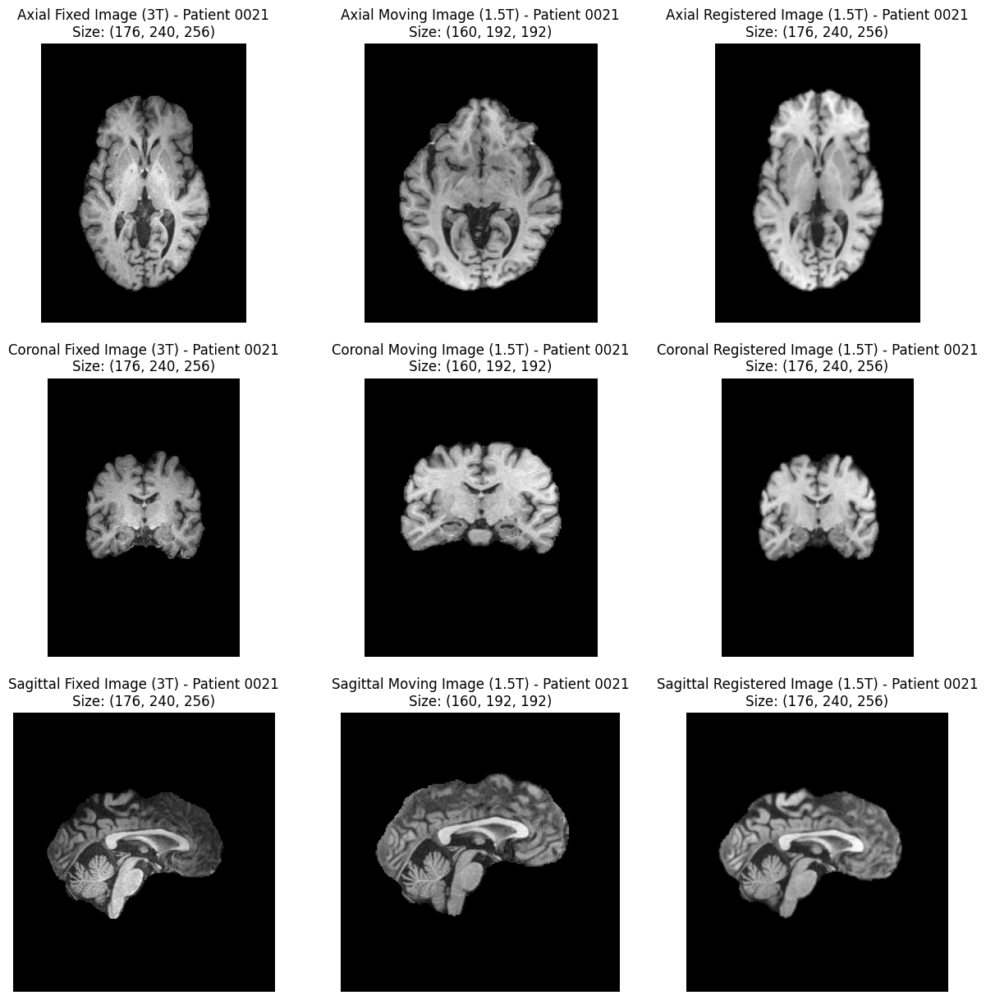

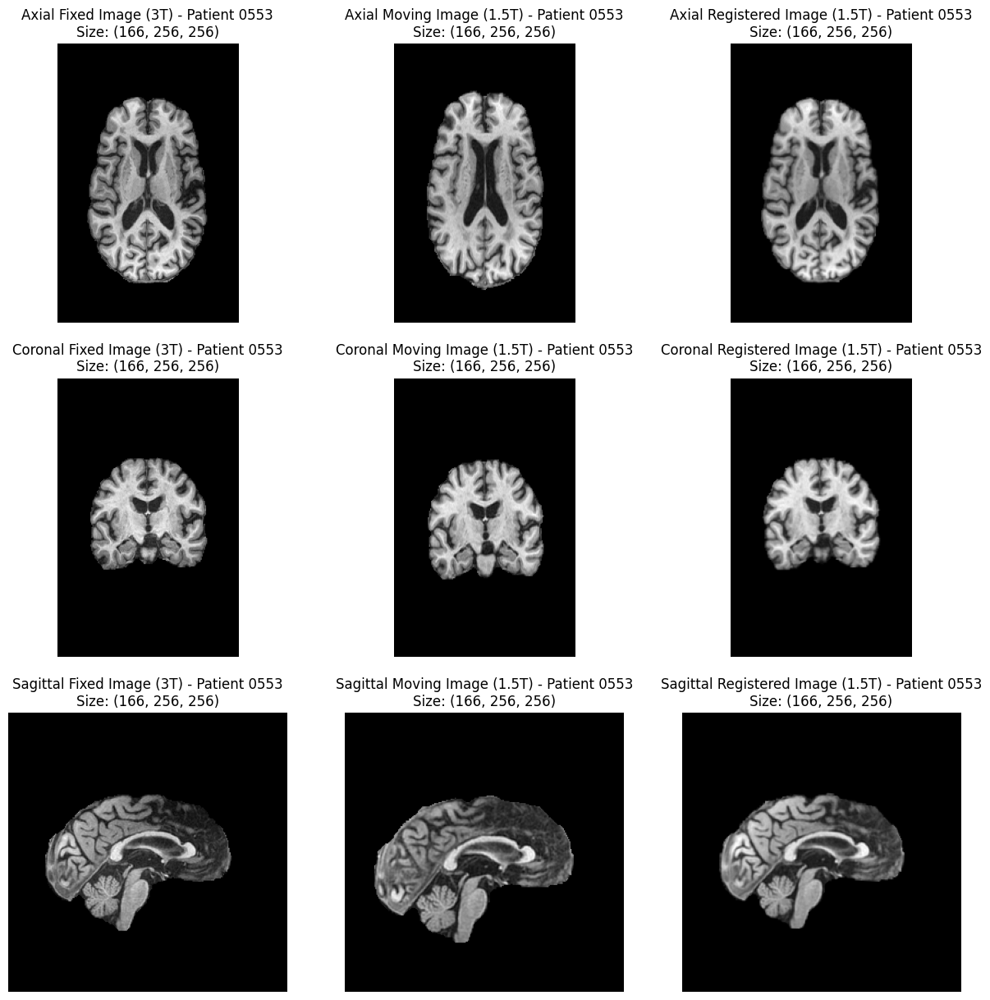

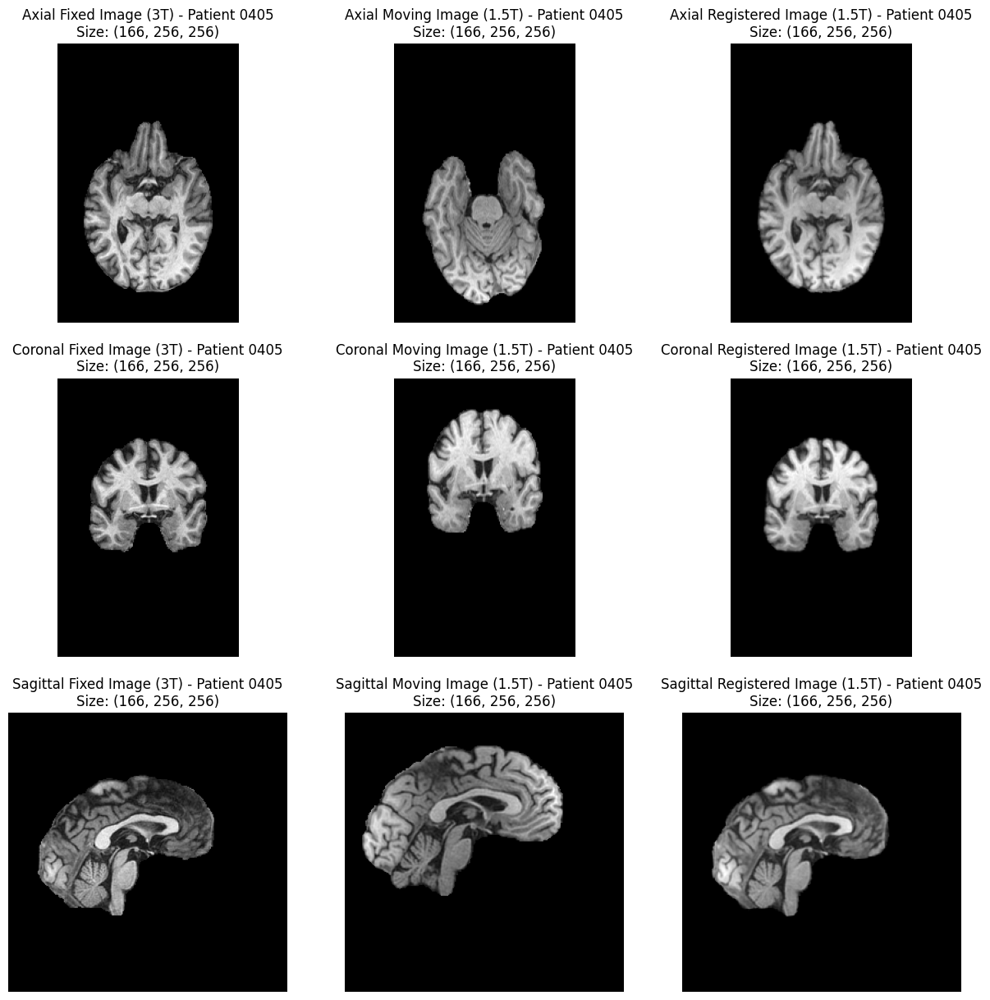

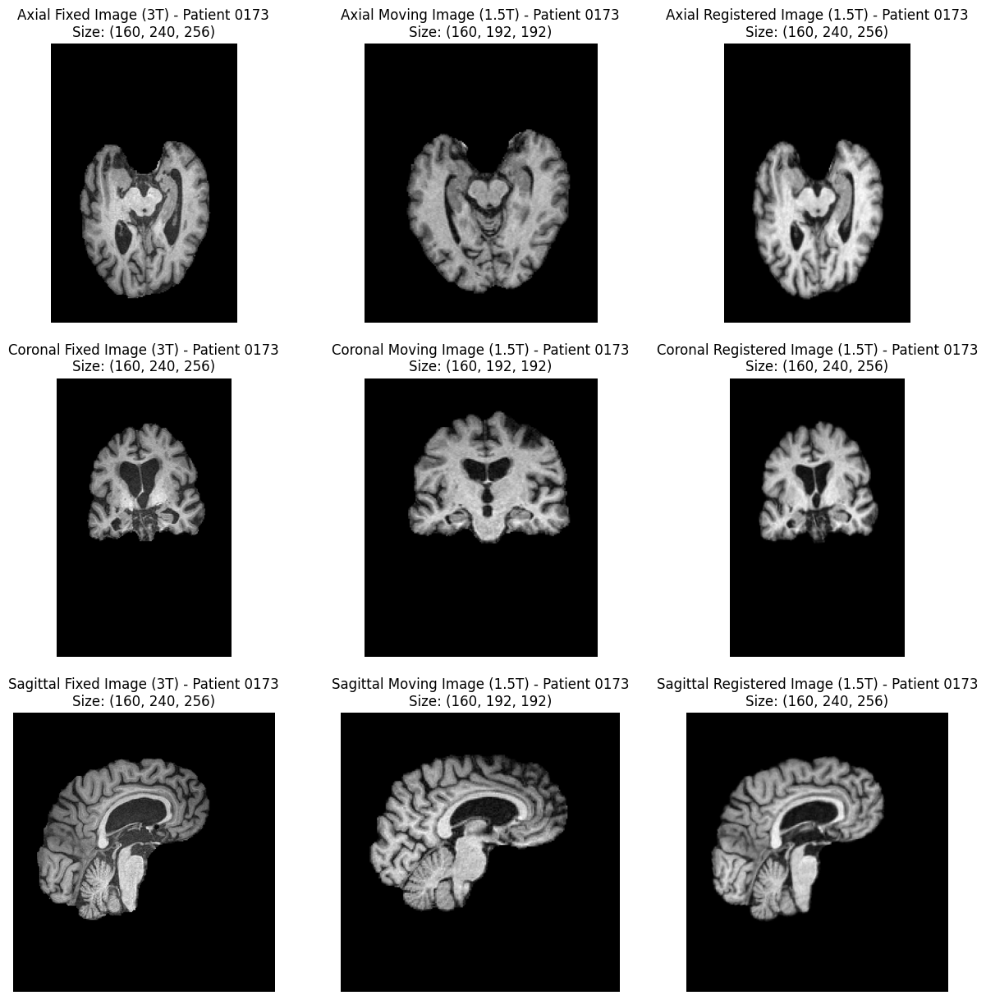

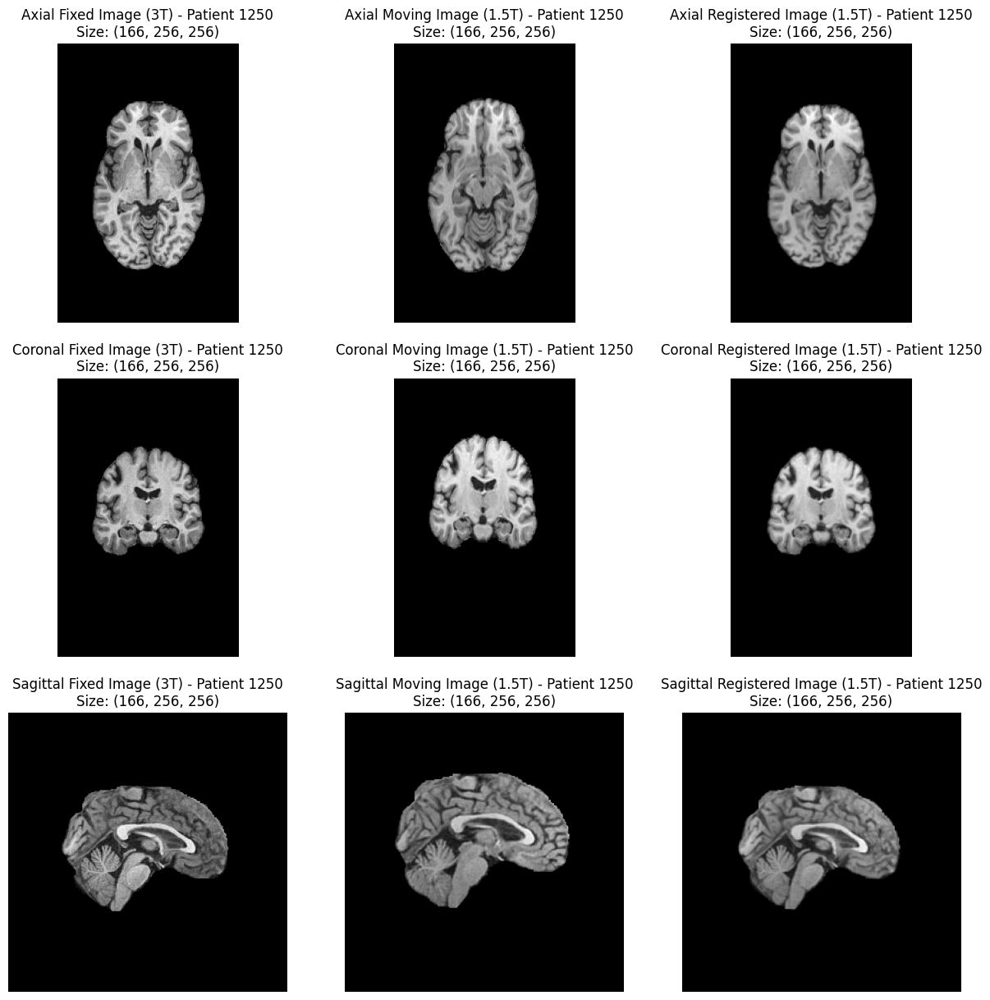

In [21]:
def visualize_registration(fixed_image, moving_image, registered_image, patient_id):
    fig, axes = plt.subplots(3, 3, figsize=(15, 15))
    
    fixed_slice = sitk.GetArrayViewFromImage(fixed_image)
    moving_slice = sitk.GetArrayViewFromImage(moving_image)
    registered_slice = sitk.GetArrayViewFromImage(registered_image)
    

    fixed_size = fixed_image.GetSize()
    moving_size = moving_image.GetSize()
    registered_size = registered_image.GetSize()
    
    axes[0, 0].imshow(np.flipud(fixed_slice[fixed_slice.shape[0] // 2]), cmap='gray')
    axes[0, 0].set_title(f'Axial Fixed Image (3T) - Patient {patient_id}\nSize: {fixed_size}')
    axes[0, 0].axis('off')

    axes[1, 0].imshow(np.flipud(fixed_slice[:, fixed_slice.shape[1] // 2, :]), cmap='gray')
    axes[1, 0].set_title(f'Coronal Fixed Image (3T) - Patient {patient_id}\nSize: {fixed_size}')
    axes[1, 0].axis('off')

    axes[2, 0].imshow(np.flipud(fixed_slice[:, :, fixed_slice.shape[2] // 2]), cmap='gray')
    axes[2, 0].set_title(f'Sagittal Fixed Image (3T) - Patient {patient_id}\nSize: {fixed_size}')
    axes[2, 0].axis('off')
    
    axes[0, 1].imshow(np.flipud(moving_slice[moving_slice.shape[0] // 2]), cmap='gray')
    axes[0, 1].set_title(f'Axial Moving Image (1.5T) - Patient {patient_id}\nSize: {moving_size}')
    axes[0, 1].axis('off')

    axes[1, 1].imshow(np.flipud(moving_slice[:, moving_slice.shape[1] // 2, :]), cmap='gray')
    axes[1, 1].set_title(f'Coronal Moving Image (1.5T) - Patient {patient_id}\nSize: {moving_size}')
    axes[1, 1].axis('off')

    axes[2, 1].imshow(np.flipud(moving_slice[:, :, moving_slice.shape[2] // 2]), cmap='gray')
    axes[2, 1].set_title(f'Sagittal Moving Image (1.5T) - Patient {patient_id}\nSize: {moving_size}')
    axes[2, 1].axis('off')
    
    axes[0, 2].imshow(np.flipud(registered_slice[registered_slice.shape[0] // 2]), cmap='gray')
    axes[0, 2].set_title(f'Axial Registered Image (1.5T) - Patient {patient_id}\nSize: {registered_size}')
    axes[0, 2].axis('off')

    axes[1, 2].imshow(np.flipud(registered_slice[:, registered_slice.shape[1] // 2, :]), cmap='gray')
    axes[1, 2].set_title(f'Coronal Registered Image (1.5T) - Patient {patient_id}\nSize: {registered_size}')
    axes[1, 2].axis('off')

    axes[2, 2].imshow(np.flipud(registered_slice[:, :, registered_slice.shape[2] // 2]), cmap='gray')
    axes[2, 2].set_title(f'Sagittal Registered Image (1.5T) - Patient {patient_id}\nSize: {registered_size}')
    axes[2, 2].axis('off')
    
    plt.show()

def visualize_patient_folder(output_dir, original_dataset_dir):
    patient_folders = [f.path for f in os.scandir(output_dir) if f.is_dir()]
    for patient_folder in patient_folders:
        patient_id = os.path.basename(patient_folder)
        registered_image_path = glob.glob(os.path.join(patient_folder, '*1_5T_registered.nii.gz'))
        original_image_3T_path = glob.glob(os.path.join(patient_folder, '*3_0T*.nii.gz'))
        
        if registered_image_path and original_image_3T_path:
            registered_image = load_image(registered_image_path[0])
            original_image_3T = load_image(original_image_3T_path[0])
            
            original_image_1_5T_filename = os.path.basename(registered_image_path[0]).replace('_registered', '')
            original_image_1_5T_path = os.path.join(original_dataset_dir, original_image_1_5T_filename)
            
            if not os.path.exists(original_image_1_5T_path):
                print(f"Original 1_5T image not found for {registered_image_path[0]}")
                continue
            
            original_image_1_5T = load_image(original_image_1_5T_path)
            visualize_registration(original_image_3T, original_image_1_5T, registered_image, patient_id)

original_dataset_dir = '/scratch/Costanza/ADNI_F_SkullStripping'
visualize_patient_folder('/scratch/Costanza/Registration/ADNI_F_SK_Registered_2', original_dataset_dir)